**Importing packages**

In [142]:
import spacy
import os
import glob
import codecs
import pandas as pd
from pandas import DataFrame
import numpy as np
from numpy.random import randint
from wordcloud import WordCloud
from gensim import corpora
from random import shuffle
from tqdm import tqdm
from nltk.stem import SnowballStemmer
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNetCV
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.cluster import KMeans
from sklearn.metrics import r2_score
from keras.regularizers import l1, l2, l1_l2
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
from keras import backend as K
from keras.models import Sequential
from keras.layers import Activation, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNetCV
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_predict
from multiprocessing import cpu_count
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from collections import Counter
import matplotlib.pyplot as plt
import warnings; warnings.simplefilter('ignore')
%matplotlib inline
%matplotlib notebook
import seaborn as sns
%matplotlib inline
nlp = spacy.load('en')

**Loading documents**

In [3]:
#Loading general file of reverse data
reverse_list = pd.read_csv('case_metadata.csv')

#the text files have to be in folder "cases" in the same folder of the code
fileDir = os.path.dirname(os.path.realpath('__file__'))
files = glob.glob('cases/*.txt')
files = files[1600:2600] #Sampling 200 cases (1000 takes huge time)

#reverse list    
caseid = list(reverse_list['caseid'])
year = sorted([column[6:10] for column in files])
files = [x for _,x in sorted(zip(year,files))]

#loading text data from different files
TextData = list(range(len(files)))
for f in range(len(files)):
    with codecs.open(files[f], 'r', encoding='utf-8') as myfile:
        TextData[f] = myfile.read()

    files[f] = files[f].replace("cases/","").replace(".txt","")
    
count = 0
reverse = list(range(len(files)))
judge = list(range(len(files)))
cites = list(range(len(files)))
fcaseid = [column[5:] for column in files] 
for m in range(len(reverse_list)):
    for o in range(len(fcaseid)):
        if reverse_list.at[m,'caseid'] == fcaseid[o]:
            reverse[count] = reverse_list.at[m,'case_reversed']
            judge[count] = reverse_list.at[m,'judge_id']
            cites[count] = reverse_list.at[m,'log_cites']
            count = count + 1

new_reverse_list = DataFrame({'caseid':fcaseid, 'year':year, 'reverse_result':reverse, 'trigrams':year, 'judge_id':judge, 'log_cites':cites})


**Spliting into sentences, words, & letters**

In [4]:
S = list(range(len(files)))

for n in tqdm(range(0,len(files))):
     doc = nlp(TextData[n])   
     S[n] = list(doc.sents)

100%|██████████| 1000/1000 [02:34<00:00,  2.73it/s]


**Normalize your corpus. and feature set of all trigrams that end in a noun**

In [5]:
#Normalizing the text data
S_clean = list(S)
stemmer = SnowballStemmer('english') 
stoplist = stopwords.words('english') 

for k in tqdm(range(len(S))):
    for l in range(len(S[k])):
        part = S[k][l]
      #Lemmatizing AND removing punctuations AND stop words and stemming
        e = ""
        for token in part:
            if token.pos_ != 'PUNCT' and token.lemma_ != '-pron-' and token.lemma_ != '-PRON-' and not token.is_stop:
                stemmedtoken = stemmer.stem(token.lemma_)
                e = e + " " + stemmedtoken
        S_clean[k][l] = nlp(e)

100%|██████████| 1000/1000 [01:51<00:00,  5.30it/s]


In [112]:
#N-grams
df_data = new_reverse_list
df_data['log_cites'].fillna(0,inplace=True)
df_data['judge_id'].fillna(0,inplace=True)

for g in tqdm(range(len(S_clean))):
    ngram = list(range(300000))
    count = 0
    for i in range(len(S_clean[g])):
        doc = S_clean[g][i]    
        skiped_doc = doc[2:]
        for token in skiped_doc:
            if token.pos_ == 'NOUN':
                sample = str(S_clean[g][i][token.i-3:token.i])
                if sample != '':
                    ngram[count] = sample
                    sample = ''
                    count = count + 1

    ngram = ngram[:count]                
    df_data.at[g,'trigrams']= ngram

100%|██████████| 1000/1000 [00:12<00:00, 79.67it/s]


**dataframe with at least 1000 features of the ngrams** 

In [7]:
frequencies = Counter()

for tokens in df_data['trigrams']:
    frequencies.update(tokens)

cleaned_freqs = []
for tokens in df_data['trigrams']:
    cleaned_freqs.append(Counter(tokens))
    
features = pd.DataFrame(cleaned_freqs)
features.fillna(0,inplace=True)

**PROBLEM1 Take your best-performing logistic regression model from Problem Set 1 (or train a new one). Use cross_val_predict() to form model predictions for each observation. Construct a confusion matrix for the predictions. Report the precision_recall_curve() and roc_curve(). Make a calibration plot (as in Bansak et al 2018, appendix page 24).**

In [15]:
X = features
Y = df_data['reverse_result']
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
logreg = LogisticRegression()
logreg.fit(X_train, Y_train)

Y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression: {:.2f}'.format(logreg.score(X_test, Y_test)))
print('F1 score of logistic regression: {:.2f}'.format(f1_score(Y_test, Y_pred, average='weighted')))

Accuracy of logistic regression: 0.66
F1 score of logistic regression: 0.57


In [16]:
nthreads = cpu_count() - 1

# Form cross-validated prdictions for all data points
df_data['reverse_reg'] = cross_val_predict(logreg,
                                         features,
                                         df_data['reverse_result'],
                                         cv=3,
                                         n_jobs=nthreads)

In [17]:
# Construct confusion matrix
confusion_matrix(df_data['reverse_result'], df_data['reverse_reg'])

array([[ 14, 342],
       [ 18, 626]])

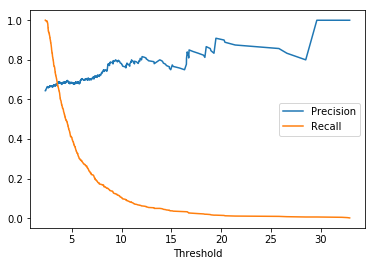

In [21]:
# Visualizing the precision/recall tradeoff
y_scores = cross_val_predict(logreg,
                             features,
                             df_data['reverse_reg'],
                             cv=3,
                             method='decision_function',
                             n_jobs=nthreads)

precisions, recalls, thresholds = precision_recall_curve(df_data['reverse_result'], y_scores)

plt.plot(thresholds, precisions[:-1], label="Precision")
plt.plot(thresholds, recalls[:-1], label="Recall")
plt.xlabel('Threshold')
plt.legend()


In [33]:
y = df_data['log_cites']
#ROC Curve
fpr, tpr, thresholds = roc_curve(y, y_scores)
plt.plot(fpr, tpr)
plt.plot([0,1],[0,1],'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

ValueError: continuous format is not supported

In [ ]:
#Calibration plot

**PROBLEM2 Scale your n-gram frequencies while maintaining sparsity, as discussed in class. Train an elastic net model to predict log citations to a case (log_cites). Run cross_val_predict() to form model predictions and report a scatter plot of true and predicted values.** 

In [35]:
# Scaling with Sparsity
sparse_scaler = StandardScaler(with_mean=False)
features_sparse = sparse_scaler.fit_transform(features)

In [42]:
# Elastic Net
enet_reg = ElasticNetCV(alphas=[.0001, .001, .01,.1,1], 
                        l1_ratio=[.0001, .001, .01,.1,.5,.9, .99, 1])
enet_reg.fit(features_sparse,df_data['log_cites'])

ElasticNetCV(alphas=[0.0001, 0.001, 0.01, 0.1, 1], copy_X=True, cv='warn',
       eps=0.001, fit_intercept=True,
       l1_ratio=[0.0001, 0.001, 0.01, 0.1, 0.5, 0.9, 0.99, 1],
       max_iter=1000, n_alphas=100, n_jobs=None, normalize=False,
       positive=False, precompute='auto', random_state=None,
       selection='cyclic', tol=0.0001, verbose=0)

In [ ]:
df_data['cites_enet'] = cross_val_predict(enet_reg,
                                         features_sparse,
                                         df_data['log_cites'],
                                         cv=3,
                                         n_jobs=nthreads)

In [ ]:
plt.scatter(df_data['log_cites'],df_data['cites_enet'],alpha=.1)
plt.xlabel('True')
plt.ylabel('Predicted')
plt.show()

**PROBLEM3 Use the judge identifiers (judge_id) to produce the average citations to cases for each judge. Then estimate a two-stage least-squares model with Z as average citations of the judge, X as citations to the case, and Y as whether the case was reversed. Include year fixed effects.**

In [92]:
#averaging citation
seen = set()
uniq = [x for x in df_data['judge_id'] if x not in seen and not seen.add(x)] 

for b in range(len(uniq)):
    idx = [x for x in df_data['judge_id']==uniq[b]]
    lis = df_data['log_cites'][idx]
    if sum(lis) != 0:
        avg = sum(lis)/len(lis)
        df_data.at[idx,'log_cites_avg'] = avg
df_data['log_cites_avg'].fillna(0,inplace=True)


KeyError: 'citeCount'

In [105]:
#Use the judge identifiers (judge_id) to produce the average
#citations to cases for each judge. Then estimate a two-stage 
#least-squares model with Z as average citations of the judge,
#X as citations to the case, and Y as whether the case was reversed. 
#Include year fixed effects.
#df = pd.read_csv('state-tax-govt-data.csv')
df_data['log_gdp'] = np.log(df_data['log_cites_avg'])
df_data['log_incometax'] = np.log(df_data['reverse_result'])
keep = pd.notnull(df_data['log_gdp'] ) & np.isfinite(df_data['log_incometax'])
df_new = df_data[keep]

df_new['const'] = 1

from linearmodels.iv import IV2SLS
# OLS
formula_ols = 'log_gdp ~ 1 + C(judge_id) + C(year) + log_incometax'
ols = IV2SLS.from_formula(formula_ols, data=df_new)
results_ols = ols.fit(cov_type='clustered',clusters=df_new['judge_id'])
results_ols

# First Stage
formula_fs = 'log_incometax ~ 1 + C(judge_id) + C(year) + vote_nec_any_tax_inc'
fs = IV2SLS.from_formula(formula_fs, data=df_new)
results_fs = fs.fit(cov_type='clustered',clusters=df_new['judge_id'])
results_fs

# Reduced Form
formula_rf = 'log_gdp ~ 1 + C(judge_id) + C(year) + vote_nec_any_tax_inc'
rf = IV2SLS.from_formula(formula_rf, data=df_new)
results_rf = rf.fit(cov_type='clustered',clusters=df_new['judge_id'])
results_rf

# 2SLS
formula_iv = 'log_gdp ~ 1 + C(judge_id) + C(year) + [log_incometax ~ vote_nec_any_tax_inc]'
iv = IV2SLS.from_formula(formula_iv, data=df_new)
results = iv.fit(cov_type='clustered',clusters=df_new['judge_id'])
results


ValueError: regressors [exog endog] do not have full column rank

**PROBLEM4 Train LDA on the cases. Produce word clouds for the topics. Inspect the word clouds for different models to decide on the right number of topics.**

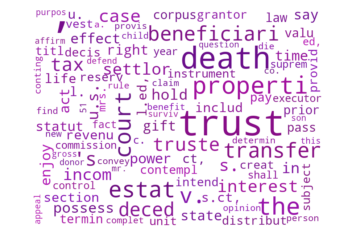

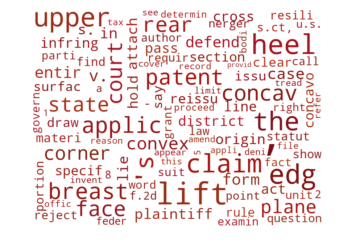

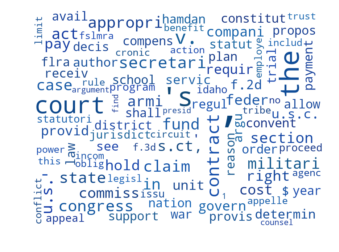

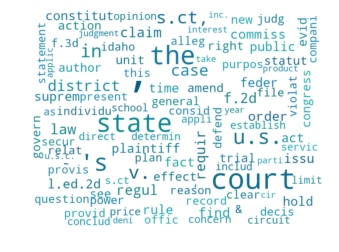

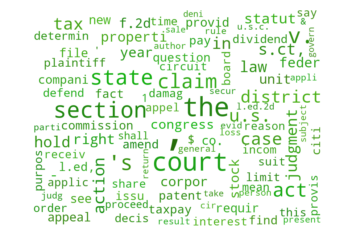

...

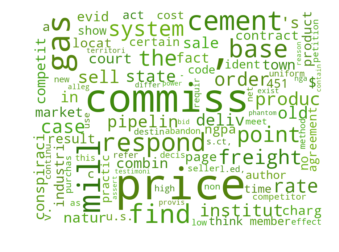

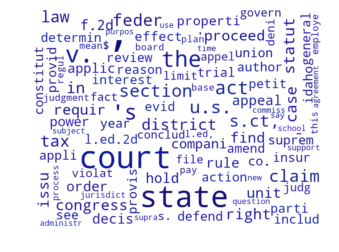

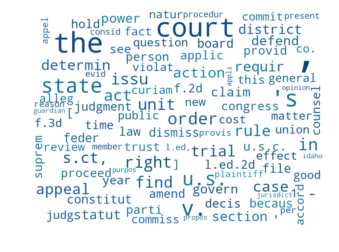

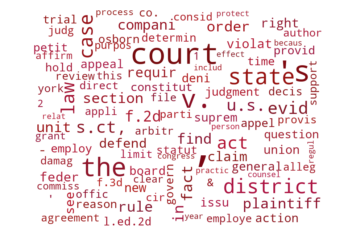

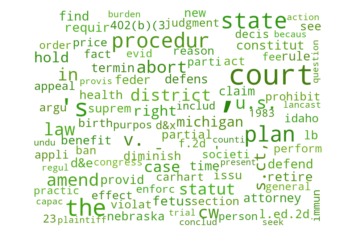

In [215]:
# LDA
documents = S_clean      

# randomize document order
shuffle(documents)

documents = [str(doc) for doc in documents]
documents = [doc.split() for doc in documents]
# creating the term dictionary
dictionary = corpora.Dictionary(documents)

# creating the document-term matrix
doc_term_matrix = [dictionary.doc2bow(doc) for doc in documents]

# train LDA with 10 topics and print
from gensim.models.ldamodel import LdaModel
lda = LdaModel(doc_term_matrix, num_topics=10
               id2word = dictionary, passes=3)

# make word clouds for the topics
for i,weights in lda.show_topics(num_topics=-1,
                                 num_words=100,
                                 formatted=False):
    
    maincol = randint(0,360)
    def colorfunc(word=None, font_size=None, 
                  position=None, orientation=None, 
                  font_path=None, random_state=None):   
        color = randint(maincol-10, maincol+10)
        if color < 0:
            color = 360 + color
        return "hsl(%d, %d%%, %d%%)" % (color,randint(65, 75)+font_size / 7, randint(35, 45)-font_size / 10)   

    
    wordcloud = WordCloud(background_color="white", 
                          ranks_only=False, 
                          max_font_size=120,
                          color_func=colorfunc,
                          height=600,width=800).generate_from_frequencies(dict(weights))

    plt.clf()
    plt.imshow(wordcloud,interpolation="bilinear")
    plt.axis("off")
    plt.show()

**PROBLEM5 Replicate your sklearn logistic regression model (no hidden layers, L2 regularization, and softmax output layer) in Keras or some other deep learning library. Compare performance. Now add two hidden layers, dropout, and batch normalization. Compare performance.**

In [ ]:
cleaned_freqs = []
for tokens in df_data['trigrams']:
    cleaned_freqs.append(Counter(tokens))
X = pd.DataFrame(cleaned_freqs)
X.fillna(0,inplace=True)
Y = df_data['reverse_result']

In [180]:
# Regression model with R-squared
Yreg = np.log(1+df_data['log_cites'])
model1 = Sequential() # create a sequential model
model1.add(Dense(64, # output neurons in layer       
          input_dim=X.shape[1], # number of inputs
          activation='relu')) # activation function
model1.add(Dense(64, activation='relu')) # hidden layer
#model.add(Dense(1,activation='sigmoid'))
model1.add(Dense(64)) # output layer
model1.summary()

# fit the model
model1.compile(loss='binary_crossentropy', # cost function
              optimizer='adam', # use adam as the optimizer
              metrics=['accuracy']) # compute accuracy, for scoring

from keras import backend as K
def r2(y_true, y_pred):
    SS_res =  K.sum(K.square( y_true-y_pred )) 
    SS_tot = K.sum(K.square( y_true - K.mean(y_true) ) ) 
    return ( 1 - SS_res/(SS_tot + K.epsilon()) )

model1.compile(loss='mean_squared_error', # cost function
              optimizer='adam', # use adam as the optimizer
              metrics=[r2]) # compute r-squared

Ypred = model1.predict(X)

model.add(Dense(64,activation='sigmoid'))

# regularization
model1.add(Dense(64, 
                kernel_regularizer=l2(0.01),
                activity_regularizer=l1(0.01)))
model1.add(Dense(64, 
                kernel_regularizer=l1_l2(l1=0.01,l2=.01),
                activity_regularizer=l1_l2(l1=0.01,l2=.01)))

# Optimizers
model1.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model1.compile(optimizer='sgd',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model1_info = model1.fit(X, Y, 
                      epochs=5,
                      validation_split=.2)

# Plot performance by epoch
plt.plot(model_info.epoch,model1_info.history['acc'])
plt.plot(model_info.epoch,model1_info.history['val_acc'])
plt.legend(['train', 'val'], loc='best')
plt.show()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_194 (Dense)            (None, 64)                50717312  
_________________________________________________________________
dense_195 (Dense)            (None, 64)                4160      
_________________________________________________________________
dense_196 (Dense)            (None, 64)                4160      
Total params: 50,725,632
Trainable params: 50,725,632
Non-trainable params: 0
_________________________________________________________________


ValueError: Error when checking target: expected dense_199 to have shape (64,) but got array with shape (1,)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_35 (Dense)             (None, 50)                39622900  
_________________________________________________________________
dense_36 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_37 (Dense)             (None, 1)                 51        
Total params: 39,625,501
Trainable params: 39,625,501
Non-trainable params: 0
_________________________________________________________________
Train on 800 samples, validate on 200 samples
Epoch 1/5
800/800 [==============================] - 39s 49ms/step - loss: 0.6910 - acc: 0.5237 - val_loss: 0.6728 - val_acc: 1.0000
Epoch 2/5
800/800 [==============================] - 38s 47ms/step - loss: 0.6753 - acc: 0.5787 - val_loss: 0.6379 - val_acc: 0.6100
Epoch 3/5
800/800 [==============================] - 36s 46ms/step - loss: 0.6135 

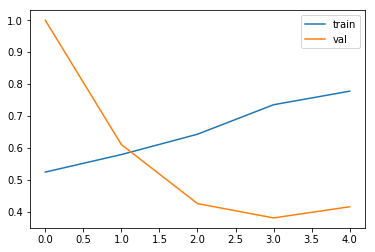

In [143]:
model = Sequential() # create a sequential model
model.add(Dense(50, # output neurons in layer       
          input_dim=X.shape[1], # number of inputs
          activation='relu')) # activation function
model.add(Dense(50, activation='relu')) # hidden layer
model.add(Dense(1, activation='sigmoid')) # output layer
model.summary()


# fit the model
model.compile(loss='binary_crossentropy', # cost function
              optimizer='adam', # use adam as the optimizer
              metrics=['accuracy']) # compute accuracy, for scoring

# Regression model with R-squared
Yreg = np.log(1+df_data['log_cites'])
model = Sequential() # create a sequential model
model.add(Dense(50, # output neurons in layer       
          input_dim=X.shape[1], # number of inputs
          activation='relu')) # activation function
model.add(Dense(50, activation='relu')) # hidden layer
model.add(Dense(1)) # output layer

from keras import backend as K
def r2(y_true, y_pred):
    SS_res =  K.sum(K.square( y_true-y_pred )) 
    SS_tot = K.sum(K.square( y_true - K.mean(y_true) ) ) 
    return ( 1 - SS_res/(SS_tot + K.epsilon()) )

model.compile(loss='mean_squared_error', # cost function
              optimizer='adam', # use adam as the optimizer
              metrics=[r2]) # compute r-squared

Ypred = model.predict(X)
r2_score(Yreg,Ypred)

# batch normalization
from keras.layers.normalization import BatchNormalization
model.add(Dense(64, use_bias=False)) 
model.add(BatchNormalization())
model.add(Activation('relu'))

# Dropout
from keras.layers import Dropout
model.add(Dropout(0.5))
model.add(Dense(1,activation='sigmoid'))

# Optimizers
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.compile(optimizer='sgd',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model_info = model.fit(X, Y, 
                      epochs=5,
                      validation_split=.2)

# Plot performance by epoch
plt.plot(model_info.epoch,model_info.history['acc'])
plt.plot(model_info.epoch,model_info.history['val_acc'])
plt.legend(['train', 'val'], loc='best')
plt.show()